In [1]:
import numpy as np
from scipy.stats import bernoulli
import pickle
import math

In [2]:
def initialize(N, T):
    """
    Parameters
    N - is the number of arms
    T - timesteps
    """
    H = np.zeros((T+2, N)) #2D Array telling number of times an arm has been played till round T
    Q = np.zeros((T+2, N)) #2D Array telling whether containing queue (can be made shorter)
    D = np.zeros((T+2, N)) #2D Array telling whether an arm was played in round T
    U = np.zeros((T+1, N))
    S_hat = np.zeros((T+1, N)) #2D Array storing the cumulated sum of rewards achieved by pulling arm i till time t
    X = np.zeros((T+1, N))
    
    return H, Q, D, U, S_hat, X

def compute_utility_arm(X, t, i, D, H, S_hat):
    """
    Parameters
    X - 2D Array of rewards for arm across T
    t - time round
    i - arm index
    D - 2D array telling whether an arm is played in round i
    H - 
    """
    u_simple = 0
    
    u_simple = S_hat[t-1][i]/H[t-1][i]
    u = min(u_simple + np.sqrt((3*np.log(t))/(2*H[t-1][i])),1)
    return(u)

def find_arms(Q, U, t, eta, m):
    rewards = np.zeros(Q.shape[1])
    for i in range(Q.shape[1]):
        rewards[i] = Q[t][i] + eta*U[t][i]
    arms = np.argsort(rewards)[::-1][0:m]
    return(arms)
    
def LFG(N, T, R, Mu, eta, m = 1):
    """
    Parameters
    N - is the number of arms
    T - timesteps
    R - fraction telling number of times each arm has to be played
    """
    
    H, Q, D, U, S_hat, X = initialize(N, T)
    for t in range(0,T+1):
        for arm in range(N):
            if H[t-1][arm] > 0:
                U[t][arm] = compute_utility_arm(X, t, arm, D, H, S_hat)
            else:
                U[t][arm] = 1
                
            Q[t][arm] = max(Q[t-1][arm] + R[arm] - D[t-1][arm], 0)
        #print(S_hat)
        ### Finding arms with maximum objective
        arms = find_arms(Q, U, t, eta, m)
        
        D[t][arms] = 1
        # print(arms)
        for arm in arms:
            X[t][arm] = bernoulli.rvs(Mu[arm], size=1)[0]
        for arm in range(Mu.shape[0]):
            H[t][arm] = H[t-1][arm] + D[t][arm]
            S_hat[t][arm] = S_hat[t-1][arm] + X[t][arm]
  #  regret = 
            
    return H,Q,D,U,X,S_hat

In [3]:
def fairness_compute(H, r, t, alpha=0):
  return np.max(np.maximum(t*r - H[t],0))

In [4]:
def fairness_compute_UCB(H, r, t, alpha=0):
  return np.max(np.maximum(t*r - H,0))

In [5]:
def regret_compute(t,r,u,S_hat):
  reward_received = np.sum(S_hat[t])
  reward_optimal_fair = np.sum(t*r*u)+(1-np.sum(r))*t*np.max(np.array(u))
  return reward_optimal_fair - reward_received

In [6]:
def regret_compute_UCB(t,r,u,S_hat):
  reward_received = np.sum(S_hat)
  reward_optimal_fair = np.sum(t*r*u)+(1-np.sum(r))*t*np.max(np.array(u))
  return reward_optimal_fair - reward_received

In [7]:
def UCB(numbers_of_selections,sums_of_reward,n):
    Arm = 0
    max_upper_bound = 0
    for i in range(0, len(numbers_of_selections)):
        if (numbers_of_selections[i] > 0):
            average_reward = sums_of_reward[i] / numbers_of_selections[i]
            delta_i = math.sqrt(2 * math.log(n) / numbers_of_selections[i])
            upper_bound = average_reward + delta_i
        else:
            upper_bound = 1e400
        if upper_bound > max_upper_bound:
            max_upper_bound = upper_bound
            Arm = i
    return Arm

In [8]:
def Main_Algo(k, T, r, u, alpha):
  N = np.array([1]*k)
  S = []  #Total reward
  RR = []
  FV = []
  for f in range(k):
      S.append(bernoulli.rvs(u[f], size=1)[0])
  # S = [0]*k
  for t in range(k+1,T+1):
      temp = []
      A = []
      A_Val = []
      for i in range(k):
          if (r[i]*(t-1) - N[i]) > alpha:
              A.append(i)
              A_Val.append(r[i]*(t-1) - N[i])
      if A:
          Arm = A[np.argmax(np.array(A_Val))]
      else:
          Arm = UCB(N,S,t)
      N[Arm] += 1
      S[Arm] += bernoulli.rvs(u[Arm], size=1)[0]
      RR.append(regret_compute_UCB(t,r,u,S))
      #print(fairness_compute_UCB(N, r, t))
      FV.append(fairness_compute_UCB(N, r, t))
  return N, S, np.array(RR), FV

In [9]:
#REGRET_PARAMETERS
k = 10       #number of arms
u = np.zeros(k)
for i in range(k):
  u[i] = (0.8-0.01*i)
eta = 1000
r = np.array([0.05]*k)
# r = np.array([0.25, 0.3, 0.2])
T = int(1000000)

In [10]:
H,Q,D,U,X,S_hat = LFG(k, T, r, np.array(u), eta, 1)
cumulative_regret = []
for t in range(10,T+1,100):
  cumulative_regret.append(regret_compute(t,r,u,S_hat))

In [11]:
N, S, RR, FV = Main_Algo(k, T, r, np.array(u), 0)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000000000044
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000000000266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000000000266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000000071
0.10000000000000053
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000000071
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000000071
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000000071
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000000071
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.1000000000

0.15000000000009095
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547


0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000006821
0.10000000000002274
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.2000000

0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999954525
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0

0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0

0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642

0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000013642
0.15000000000009095
0.20000000000004547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0

0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819

0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.09999999999990905
0.15000000000009095
0.20000000000027285
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0

0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000009095
0.20000000000027285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0

0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0

0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.1999999999998181
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.19999999999

0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050

0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.20000000000

0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000

0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2

0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.

0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457

0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.100000000000363

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000018

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000

0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000018

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.100000000000363

0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500

0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.15000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000

0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2

0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000

0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000

0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2

0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000018

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000018

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.10000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000001819
0.1000000000003638
0.1500000000005457
0.2000000000007276
0.25
0.3000000000001819
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000018

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000109

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000109

0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.10000

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000

0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.14

0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.200000000000

0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003

0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.100000000

0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.100000000

0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1499999999996362
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.10000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.100000000

0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.15

0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.150000

0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.200000000000

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003

0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.15

0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000

0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.10000

0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010

0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.200000000000

0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.35000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.300000

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350000000000363

0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.150

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.30

0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.35000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.30

0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.300000

0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350000000000363

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350000000000363

0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.150

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25


0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.300000

0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000

0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350

0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.

0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.

0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.

0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000

0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.200

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350

0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350

0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.150

0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.

0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.200

0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.

0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.150

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.300000

0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0

0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394


0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394


0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394


0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350000000000363

0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.

0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.

0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350

0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.30

0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.35000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25


0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.30

0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350000000000363

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25


0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.35000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638


0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0

0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350

0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.35000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.350

0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.35000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.30000000000109

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25
0.3000000000010914
0.3500000000003638
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000001091394
0.1000000000003638
0.1500000000014552
0.2000000000007276
0.25


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.

0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828


0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.35000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724

0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828


0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0


0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724

0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3

0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279

0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552

0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.350000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.299999999999

0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.29999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.299999999999

0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0


0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.299999999999

0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.35000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.

0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.2

0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3

0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.04999999999927

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.29999999

0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.100000000002

0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.100000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.29999999

0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.35000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724

0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828


0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828


0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.299999999999

0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552

0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828


0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.29999999

0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552

0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.35000

0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.299999999999

0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.35000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.2999999999992724
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.049999999999272404
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.35000000000

0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.200

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.35000000000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0

0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.30000000000291

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.35000000000

0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0

0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.

0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.200

0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0

0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.0
0.0
0.

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.400000000001455

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.400000000001455

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.400000000001455

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.400000000001455

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.400000000001455

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.400000000001455

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038


0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.300000000002910

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000

0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15000000000145

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000

0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.150000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.15

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.400000000001455

0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.

0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.350000000002182

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0

0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000218279
0.1500000000014552
0.2000000000007276
0.25
0.3000000000029104
0.3500000000021828
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000

0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014

0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.300000000

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000

0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436

0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029

0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436

0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029

0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.300000000

0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.300000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.300000000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1

0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0999999999985

0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.0

0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.15000

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.400000000001455

0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.300000000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.099999999

0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0

0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0

0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.349999999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038

0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.150000000

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.300000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.09999999999854481
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3499999999985448
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3500

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000

0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3500

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3500

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000

0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.3500

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.400000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.15000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.050000000002

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500

0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500

0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.1000000000058207

0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0500000000029103

0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.200000000

0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.100000000005

0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05000000000291038
0.10000000000582077
0.1500000000014552
0.20000000000436557
0.25
0.3000000000029104
0.35000000000582077
0.4000000000014552
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [12]:
cumulative_regret_UCB = []
for t in range(10,T+1,100):
  cumulative_regret_UCB.append(RR[t])

In [ ]:
# Fairness = []
# Regret = []
# for i in range(0,100000,1000):
#     N, S, RR, FV = Main_Algo(k, T, r, np.array(u), i)
#     Regret.append((t*u[0])-sum(list(S)))
#     Fairness.append(FV[-1])

# import matplotlib.pyplot as plt
# t = range(10,1000000,100)
# plt.figure(figsize=(10, 6))
# line1, = plt.plot(t, Fairness, 'b-', label='Fairness Violation')
# line2, = plt.plot(t, Regret, 'r--', label='Regret')
# plt.legend(loc='upper right')
# plt.savefig('Figure_0.png')

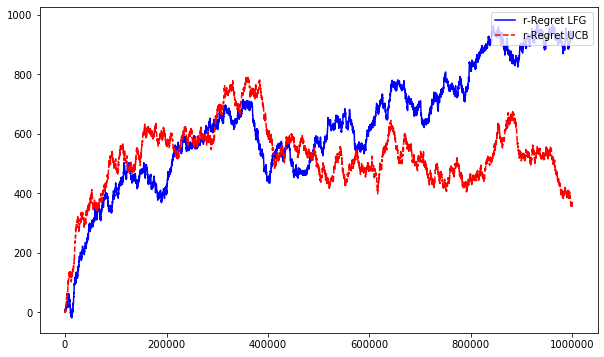

In [13]:
import matplotlib.pyplot as plt
t = range(10,1000000,100)
plt.figure(figsize=(10, 6))
line1, = plt.plot(t, cumulative_regret, 'b-', label='r-Regret LFG')
line2, = plt.plot(t, cumulative_regret_UCB, 'r--', label='r-Regret UCB')
plt.legend(loc='upper right')
plt.savefig('Figure_1.png')

In [9]:
#FAIRNESS_PARAMETERS
u = [0.4, 0.5, 0.7]
k=3
eta=1000
T=200
r = np.array([0.25,0.3,0.2])

In [10]:
H,Q,D,U,X,S_hat = LFG(k, T, r, np.array(u), eta, 1)
fairness_violation = []
for t in range(1, T+1, 1):
  fairness_violation.append(fairness_compute(H,r,t))
N, S, RR, FV = Main_Algo(k, T, r, np.array(u), 0)

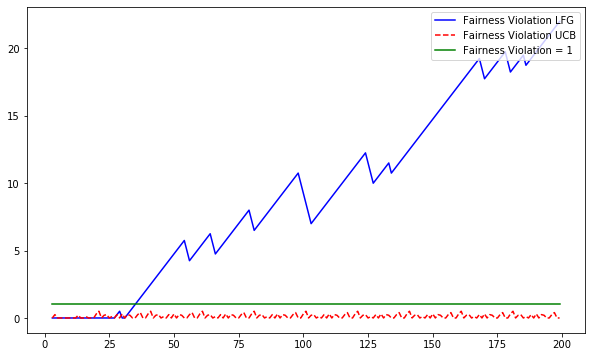

In [11]:
import matplotlib.pyplot as plt
t = range(3,T,1)
Bound = [1]*(T-k)
plt.figure(figsize=(10, 6))
line1, = plt.plot(t, fairness_violation[3:], 'b-', label='Fairness Violation LFG')
line2, = plt.plot(t, FV, 'r--', label='Fairness Violation UCB')
line2, = plt.plot(t, Bound, 'g-', label='Fairness Violation = 1')
plt.legend(loc='upper right')
plt.savefig('Figure_2.png')